# **DEPENDENCIES**

In [ ]:
import numpy as np
import tensorflow as tf
!pip install hkb_diamondsquare
from hkb_diamondsquare import DiamondSquare as DS
from scipy import ndimage
import matplotlib.pyplot as plt
import time

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for hkb_diamondsquare: filename=hkb_diamondsquare-1.0.2-py3-none-any.whl size=4674 sha256=19903e3566b72b18d71877432bb4e14a83ece74fa75a676dd47eb4aedacac16b
  Stored in directory: /root/.cache/pip/wheels/f0/7a/d5/8dfb4a2e916a6b815c7a2b06f9efcb0ac5df607aa071eee910
Successfully built hkb_diamondsquare


In [ ]:
# Check if a GPU is available
if tf.config.list_physical_devices('GPU'):
    print('>> Using GPU for computation')
    # Set the default device to the GPU
    tf.config.set_soft_device_placement(True)
    tf.config.experimental.set_memory_growth(tf.config.list_physical_devices('GPU')[0], True)
else:
    print('>> Using CPU for computation')

# Create a session with the default device
sess = tf.compat.v1.Session()

>> Using CPU for computation


# **CONFIGURATION**

In [ ]:
world_config = {
    'type_c': '8 channel primordial hive',
    'size_w': (1000, 1500, 8),
    'chan_0': 'world_tiles',
    'chan_1': 'environment_tiles',
    'chan_2': 'resource_id',
    'chan_3': 'resource_strength',
    'chan_4': 'pheromone_id',
    'chan_5': 'pheromone_strength',
    'chan_6': 'Jett_id',
    'chan_7': 'Structure_id',
    }

# **WORLD**

In [ ]:
class Drunkard_walk():

    def __init__(self,
                 map_w = 1500,
                 map_h = 1000):
        self.map_w = map_w
        self.map_h = map_h

    def generate_map(self, trips = 3):
        # Map of 0s
        mh, mw = self.map_h, self.map_w
        base_map = np.zeros((mh, mw), dtype = np.int8)
        # Initial position
        X, Y = np.random.randint(0, mw), np.random.randint(0, mh)
        # Walk
        steps = mw * mh
        directions = np.random.randint(0, 4, size = trips * steps)
        dy, dx = np.array([-1, 1, 0, 0]), np.array([0, 0, -1, 1])
        YX = np.vstack((dy[directions], dx[directions])).T.cumsum(axis = 0)
        Ys, Xs = np.mod(YX[:, 0], mh), np.mod(YX[:, 1], mw)
        base_map[Ys, Xs] = 1
        return base_map

    def map_convolution(self,
                        input_array,
                        kernel_shape = (5, 5),
                        threshold = 3/8,
                        stride = 1):
        # Define kernel
        kernel = np.ones((kernel_shape[0], kernel_shape[1]), dtype = int)
        threshold = kernel_shape[0] * kernel_shape[1] * threshold
        output_array = ndimage.convolve(input_array, kernel, mode = 'wrap')
        output_array = np.where(output_array > threshold, 1, 0)

        return output_array

    # def border_null(self, binary_array, border_width):
    #     # Set the border pixels to 0
    #     binary_array[:border_width, :] = 1
    #     binary_array[-border_width:, :] = 1
    #     binary_array[:, :border_width] = 1
    #     binary_array[:, -border_width:] = 1

    #     return binary_array

    # def interpolate_map(self, binary_array, new_shape):
    #     new_array = np.zeros(new_shape, dtype = np.int)
    #     scale_factor = np.divide(new_shape, binary_array.shape)
    #     interpolated_array = ndimage.zoom(binary_array, scale_factor, order = 0)
    #     interpolated_array = np.round(interpolated_array)
    #     interpolated_array = np.where(interpolated_array > 0.5, 1, 0)
    #     new_array[:interpolated_array.shape[0], :interpolated_array.shape[1]] = interpolated_array

    #     return new_array

    def generate_map_with_presets(self):
        M = self.generate_map(trips = 3)
        for i in range(2):
            M = self.map_convolution(M, kernel_shape = (3, 3), stride = 1)

        return M

In [ ]:
class World():
    def __init__(self, world_config, seed = None):
        self.world_config = world_config
        if seed != None:
            self.seed = seed
        else:
            self.seed = np.random.uniform(0, 1)
        self.channels = np.zeros(self.world_config['size_w'], dtype = np.float32)

    def assign(self, channel_index, assignment):
        # sess.run(tf.assign(self.channels[:, :, channel_index], assignment))
        self.channels[:, :, channel_index] = assignment

    def normalize_channel(self, channel_index):
        chan_x = self.channels[..., channel_index]
        min_chan_x = chan_x.min()
        max_chan_x = chan_x.max()
        n_chan_x = (chan_x - min_chan_x) / (max_chan_x - min_chan_x)
        self.assign(channel_index, n_chan_x)

    def generate_chan_0(self, min_h = 1, max_h = 14, tilesize = 1, roughness = 0.6, overlay = None):
        chan_0 = DS.diamond_square(shape = (self.world_config['size_w'][0]//tilesize, self.world_config['size_w'][1]//tilesize),
                                     min_height = min_h,
                                     max_height = max_h,
                                     roughness = roughness,
                                     random_seed = self.seed).astype(int)
        if type(overlay) == type(None):
            pass
        else:
            chan_0 = np.multiply(chan_0, overlay)
        self.assign(0, chan_0)
        self.normalize_channel(0)

    def generate_chan_1(self, env_min = 0, env_max = 2, tilesize = 1, roughness = 0.35):
        chan_1 = DS.diamond_square(shape = (self.world_config['size_w'][0]//tilesize, self.world_config['size_w'][1]//tilesize),
                                     min_height = env_min,
                                     max_height = env_max,
                                     roughness = roughness,
                                     random_seed = self.seed).astype(int)
        self.assign(1, chan_1)
        self.normalize_channel(1)

    def generate_chan_2(self, n_res_patches, patch_sizes, res_probs, res_base):
        chan_2 = np.zeros(res_base.shape)
        res_types = [t for t in range(1, len(res_probs) + 1)]
        base_indices = np.argwhere(res_base == 1)

        for i in range(n_res_patches):
            type_ = np.random.choice(res_types, p = res_probs)
            patch_size = patch_sizes[type_ - 1]
            while True:
                index = np.random.choice(len(base_indices))
                x0, y0 = base_indices[index]
                if chan_2[x0: x0 + patch_size, y0: y0 + patch_size].sum() == 0:
                    break

            chan_2[x0: x0 + patch_size, y0: y0 + patch_size] = type_

        self.assign(2, chan_2)
        self.normalize_channel(2)

In [ ]:
drunkard_walk = Drunkard_walk().generate_map_with_presets()

In [ ]:
world = World(world_config)

In [ ]:
world.generate_chan_0(overlay = drunkard_walk)

In [ ]:
final_map = world.channels[:,:,0]

In [ ]:
import plotly.graph_objects as go
import numpy as np
fig = go.Figure(data=go.Heatmap(z=final_map, colorscale='Viridis'))

fig.update_layout(width=1200, height=800)

# Show the plot
fig.show()

In [ ]:
pip install plotly==5.14.0

In [ ]:
import plotly.express as px

px.imshow(drunkard_walk)


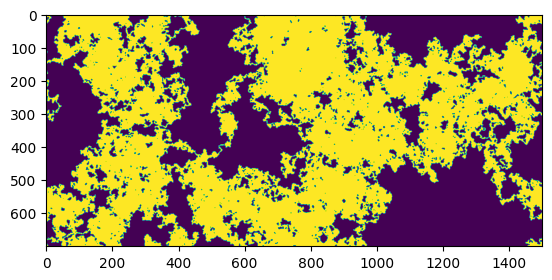

In [ ]:
plt.imshow(drunkard_walk)

# **JETT**

In [ ]:
class Jett():

    def __init__(self):
        self.brain = None
        self.vital = None



In [ ]:
import jax.numpy as jnp
import jax.scipy as jsp
from jax import jit
import tensorflow as tf

from functools import partial

#---CONSTANTS------------------------------------------------------------------

#---LAYERS---------------------------------------------------------------------
class Padding():

    def __init__(self, kernel_shape: tuple, mode: str = 'wrap'):
        self.kernel_shape = kernel_shape
        self.mode = mode

    @partial(jit, static_argnums = (0))
    def call(self, input_array: jnp.array):
        pass

class Potential():

    def __init__(self, kernel: jnp.array, pad_mode: str = 'same', pad_boundary: str = 'fill', pad_fillvalue: float = 0):
        self.kernel = kernel
        self.pad_mode = pad_mode
        self.pad_boundary = pad_boundary
        self.pad_fillvalue = pad_fillvalue

    @partial(jit, static_argnums = (0))
    def call(self, input_array: jnp.array):
        p = jsp.signal.convolve2d(input_array,
                                  self.kernel,
                                  mode = self.pad_mode,
                                  boundary = self.pad_boundary)
        return p

In [ ]:
import matplotlib.pyplot as plt
(x_train, y_train), (_, _) = tf.keras.datasets.mnist.load_data()

In [ ]:
image = x_train[0].astype(jnp.float32) / 255.  # Take one image and normalize pixel values

# Define a kernel for Potential
kernel = jnp.array([[0., 0., 0.],
                    [1., 1., 1.],
                    [0., 0., 0.]])

# Create an instance of Potential
potential = Potential(kernel, pad_boundary = 'wrap')

# Apply the potential to the image
result = potential.call(image)

plt.imshow(image)
plt.show()
# Print the result
plt.imshow(result)

NotImplementedError: ignored

In [ ]:

# Define a 2D array
arr = jnp.array([[1, 2, 3],
                 [4, 5, 6],
                 [7, 8, 9]])

# Add a 1-pixel border of zeros
arr_padded = jnp.pad(arr, pad_width = 1, mode = 'constant')

# Print the original array and the padded array
print("Original array:\n", arr)
print("Padded array:\n", arr_padded)


Original array:
 [[1 2 3]
 [4 5 6]
 [7 8 9]]
Padded array:
 [[0 0 0 0 0]
 [0 1 2 3 0]
 [0 4 5 6 0]
 [0 7 8 9 0]
 [0 0 0 0 0]]


In [ ]:
class Padding():
    def __init__(self, kernel_width: int, mode: str = 'wrap', **kwargs):
        self.pad_width = kernel_width - 2
        self.mode = mode
        self.kwargs = kwargs

    @partial(jit, static_argnums=(0,))
    def call(self, input_array: jnp.array):
        padded_array = jnp.pad(input_array,
                               self.pad_width,
                               self.mode,
                               **self.kwargs)

        return padded_array

input_array = arr
padder = Padding(kernel_width = 3, mode = 'wrap')
padded_array = padder.call(input_array)
print(f"input_array:\n{input_array}\n")
print(f"padded_array:\n{padded_array}\n")

input_array:
[[1 2 3]
 [4 5 6]
 [7 8 9]]

padded_array:
[[9 7 8 9 7]
 [3 1 2 3 1]
 [6 4 5 6 4]
 [9 7 8 9 7]
 [3 1 2 3 1]]



In [ ]:
arr.shape

(3, 3)